In [1]:
import magic
import hashlib
import json
import urllib2
import urllib
import sys
import os
import yara
import subprocess
import glob
import pandas as pd

#print 
class Static:

    def __init__(self, mal_file):
        self.file = mal_file
        self.md5 = ""

    def filetype(self):
        if os.path.exists(self.file):
            try:
                m = magic.open(magic.MAGIC_NONE)
                m.load()
                ftype = m.file(self.file)
                return ftype
            except AttributeError:
                ftype = magic.from_file(self.file)
                return ftype    
        else:
            print "No such file or directory:", self.file
            

    def get_file_size(self):
        fr = open(self.file, 'rb')
        size = len(fr.read())
        fr.close()
        return size

    
   
   

    def ascii_strings(self):
        output = subprocess.check_output(["strings", "-a", self.file])
        return output

    def unicode_strings(self):
        output = subprocess.check_output(["strings", "-a", "-el", self.file])
        return output

    def dependencies(self):
        try:
            output = subprocess.check_output(["ldd", self.file])
            return output
        except:
            pass

    def elf_header(self):
        output = subprocess.check_output(["readelf","-h",self.file])
        return output

    def program_header(self):
        output = subprocess.check_output(["readelf","-l",self.file])
        return output

    def section_header(self):
        output = subprocess.check_output(["readelf","-S",self.file])
        return output

    def symbols(self):
        output = subprocess.check_output(["readelf","-s",self.file])
        return output
    
    def reloc(self):
        output = subprocess.check_output(["readelf","-r",self.file])
        return output
    
    def dynamic_content(self):
        output = subprocess.check_output(["readelf","-d",self.file])
        return output


In [2]:
path=[]
with open('/home/anmol/Documents/nameoffinalfiles/Benginname.txt','r') as file1:
    for name in file1:
        naam=name.strip('\n')
        path.append(naam)
print path   

['/home/anmol/Downloads/C_source_code/ELFFILE/2206', '/home/anmol/Downloads/C_source_code/ELFFILE/502', '/home/anmol/Downloads/C_source_code/ELFFILE/99f38ff40ce6b19ca333e7d4e3a46507eb624df470089a4161b628dd7bf2881f', '/home/anmol/Downloads/C_source_code/ELFFILE/86bdfc27071f13b70fc256686dad8b3421d35281ba30d925125d79b5f57769cc', '/home/anmol/Downloads/C_source_code/ELFFILE/1154', '/home/anmol/Downloads/C_source_code/ELFFILE/12597', '/home/anmol/Downloads/C_source_code/ELFFILE/1863', '/home/anmol/Downloads/C_source_code/ELFFILE/2396', '/home/anmol/Downloads/C_source_code/ELFFILE/512', '/home/anmol/Downloads/C_source_code/ELFFILE/711', '/home/anmol/Downloads/C_source_code/ELFFILE/6833', '/home/anmol/Downloads/C_source_code/ELFFILE/c0e5a786555cdf800fd0815b49eade8a1d2d0d74f0a116a2debe7ca60e1e69b0', '/home/anmol/Downloads/C_source_code/ELFFILE/770', '/home/anmol/Downloads/C_source_code/ELFFILE/709', '/home/anmol/Downloads/C_source_code/ELFFILE/575', '/home/anmol/Downloads/C_source_code/ELFFILE

In [3]:

benign_data=[]
#path=glob.glob('/home/anmol/Downloads/linux_clean/*')

num=0
for clean in path:
        static = Static(clean)
        filetype = static.filetype()
        is_elf_file = True
        try:
            if is_elf_file:
                elf_header = static.elf_header()
        except Exception as e:
            print e
            continue
        num=num+1
        print num
        
        dash_lines='--------------------#######################------------------------'
        #print "Filetype: %s" % filetype
        final_report='/home/anmol/final_report.txt'


        file_size = static.get_file_size()
        #print "File Size: %0.2f KB (%s bytes)" % (file_size/1024.0, file_size)
        feature={}
        feature['Y']=0
        ##########################regex###########################
        header_info= " Entry point address|  Start of program headers|  Start of section headers|  Size of this header|  Size of program headers|  Number of program headers| Size of section headers|  Number of section headers|  Section header string table index"
        programm_header_type="NULL|LOAD|DYNAMIC|INTERP|NOTE|SHLIB|PHDR|LOOS|HIOS|LOPROC|HIPROC"
        section_header_type="NULL|PROGBITS|SYMTAB|STRTAB|RELA|HASH|DYNAMIC|NOTE|NOBITS|REL|SHLIB|DYNSYM|LOPROC|HIPROC|LOUSER|HIUSER"
        sections=".text|.bss|.comment|.data|.data1|.debug|.dynamic|.dynstr|.dynsym|.fini|.hash|.init|.got|.interp|.line|.note|.plt|.rodata|.rodata1|.shstrtab|.strtab|.symtab|.sdata|.sbss|.lit8|.gptab|.conflict|.tdesc|.lit4|.reginfo|.liblist|.rel.dyn|.rel.plt|.got.plt"
        dyna_st_bind="LOCAL|GLOBAL|WEAK|LOOS|HIOS|LOPROC|HIPROC"
        dyna_st_type="NOTYPE|OBJECT|FUNC|SECTION|FILE|COMMON|SPARC_REGISTER|TLS|LOOS|HIOS|LOPROC|HIPROC"
        dyna_name="NULL|NEEDED|PLTRELSZ|PLTGOT|HASH|STRTAB|SYMTAB|RELA|RELASZ|RELAENT|STRSZ|SYMENT|INIT|FINI|SONAME|RPATH|SYMBOLIC|REL|RELSZ|RELENT|PLTREL|DEBUG|TEXTREL|JMPREL|POSFLAG_1|BIND_NOW|INIT_ARRAY|FINI_ARRAY|INIT_ARRAYSZ|FINI_ARRAYSZ|RUNPATH|FLAGS|ENCODING|PREINIT_ARRAY|PREINIT_ARRAYSZ|MAXPOSTAGS|SUNW_AUXILIARY|SUNW_RTLDINF|SUNW_FILTER|SUNW_CAP|SUNW_SYMTAB|SUNW_SYMSZ|SUNW_ENCODING|SUNW_SORTENT|SUNW_SYMSORT|SUNW_SYMSORTSZ|SUNW_TLSSORT|SUNW_TLSSORTSZ|SUNW_CAPINFO|SUNW_STRPAD|SUNW_CAPCHAIN|SUNW_LDMACH|SUNW_CAPCHAINENT|SUNW_CAPCHAINSZ|SYMINFO|SYMINENT|SYMINSZ|VERDEF|VERDEFNUM|VERNEED|VERNEEDNUM|RELACOUNT|RELCOUNT|AUXILIARY|FILTER|CHECKSUM|MOVEENT|MOVESZ|MOVETAB|CONFIG|DEPAUDIT|AUDIT|FLAGS_1|SPARC_REGISTER"
        reloc_type="R_386_NONE|R_386_32|R_386_PC32|R_386_GOT32|R_386_PLT32|R_386_COPY|R_386_GLOB_DAT|R_386_JUMP_SLOT|R_386_RELATIVE|R_386_GOTOFF|R_386_GOTPC|R_386_32PLT|R_386_16|R_386_PC16|R_386_8|R_386_PC8|R_386_SIZE32"

        #######################elf header##############################
        h_i={'  Number of section headers': 0, '  Size of this header': 0, 
              '  Number of program headers':0, '  Start of section headers':0, 
              '  Start of program headers': 0,'  Section header string table index': 0,
              '  Size of program headers': 0}
        if is_elf_file:
            elf_header = static.elf_header()
            f = open(final_report, 'w')
            f.write(elf_header)
            f.close()
            with open(final_report,'r') as file1:
                for line in file1 :
                     if line.split(':')[0] in header_info:
                             if line.split(':')[0] in h_i:
                                     h_i[line.split(':')[0]]=int(line.split(':')[1].split()[0])
            #print h_i
            #print elf_header
        #print dash_lines  
        feature=dict(h_i.items() + feature.items())
        ##################dependencies###########################
        if is_elf_file:
            depends = static.dependencies()

          ##################programm header########################  
            p_h={'LOAD': 0, 'INTERP': 0, 'PHDR': 0, 'DYNAMIC': 0, 'NOTE': 0}
            prog_header = static.program_header()

            print "Program Header Information:"

            f = open(final_report, 'w')
            f.write(prog_header)
            f.close()

            with open(final_report,'r') as file:
                for line in file :
                      if len(line.split())>1:

                            if  line.split()[0] in programm_header_type:
                                if line.split()[0] in p_h:
                                    p_h[line.split()[0]]=1 





            #print p_h
            #print prog_header
            #print dash_lines
            feature=dict(p_h.items() + feature.items())
           ####################section header#####################
            s_h={'.rel.dyn': 0, '.note': 0, '.data1': 0, 'ini': 0, '.text': 0,
                 '.comment': 0, '.rodata1': 0, '.got': 0, '.data': 0,
                 '.rodata': 0, '.dynstr': 0, '.init': 0, '.shstrtab': 0,
                 '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, '.bss': 0, '.fini': 0,
                 '.symtab': 0, 'nit': 0, '.dynamic': 0, '.plt': 0, '.strtab': 0}
            
            s_h_type={   'HASH': 0, 'SYMTAB': 0, 'DYNAMIC': 0,
                         'NOBITS': 0, 'NOTE': 0, 'PROGBITS': 0,
                         'REL': 0, 'STRTAB': 0, 'RELA': 0,
                         'NULL': 0}
            sect_header = static.section_header()

            print "Section Header Information:"
            f = open(final_report, 'w')
            f.write(sect_header)
            f.close()


            with open(final_report,'r') as file:
                for line in file :
                      if len(line.split())>2:

                            if  line.split()[1] in sections:
                                if line.split()[1] in s_h:
                                        s_h[line.split()[1]]=1 
                            if  line.split()[2] in section_header_type and len(line.split()[2])>2:
                                if line.split()[2] in s_h_type:
                                        s_h_type[line.split()[2]]=1

            #print s_h
            #print s_h_type
            #print sect_header
            #print dash_lines
            feature=dict(s_h.items() + feature.items())
            feature=dict(s_h_type.items() + feature.items())
           #################symbol table#########################
            syms = static.symbols()
            dynS_type={'STB_LOCAL': 0, 'dynamic_s_c': 0, 'STT_NOTYPE_STB_GLOBAL': 0,
                         'STT_OBJECT_STB_WEAK': 0, 'STB_GLOBAL': 0, 'STB_WEAK': 0,
                            'STT_NOTYPE_STB_LOCAL': 0, 'STT_FUNC': 0, 'STT_FUNC_STB_GLOBAL': 0,
                             'STT_OBJECT_STB_GLOBAL': 0, 'STT_NOTYPE_STB_WEAK': 0, 'STT_NOTYPE': 0,
                                 'STT_OBJECT': 0, 'STT_FUNC_STB_WEAK': 0}
            dynF_name={}

            #print "Symbol Information:"
            f = open(final_report, 'w')
            f.write(syms)
            f.close()

            with open(final_report,'r') as file:
                flag=0
                for line in file :
                      #print line.split()

                      if len(line.split())>3 and line.split()[0]=='Symbol'and line.split()[2]=="'.dynsym'":
                            count=int(line.split()[4])
                            dynS_type['dynamic_s_c']=count
                            flag=1
                             #print count
                      if flag==1 and len(line.split())>3:
                            if line.split()[3] in  dyna_st_type:
                                if 'STT_'+line.split()[3] in dynS_type:
                                    dynS_type['STT_'+line.split()[3]]=1
                                    if line.split()[3]=='FUNC':
                                        x=line.split()[7]
                                        dynF_name[x[:x.find('@')]]=1

                                    if line.split()[4] in dyna_st_bind:
                                        if 'STB_'+line.split()[4] in dynS_type:
                                            dynS_type['STB_'+line.split()[4]]=1
                                        if 'STT_'+line.split()[3]+'_STB_'+line.split()[4] in dynS_type:
                                            dynS_type['STT_'+line.split()[3]+'_STB_'+line.split()[4]]=1
                      if flag==1 and len(line.split())==0:
                            flag=0
                      if len(line.split())>3 and line.split()[0]=='Symbol'and line.split()[2]=="'.symtab'":
                            count=int(line.split()[4])
                            #dynS_type['toatl_s_c']=count
                            break

            #print dynS_type
            #print dynF_name
             #print syms
            #print dash_lines
            feature=dict(dynS_type.items() + feature.items())
            ##################relocation section######################
            reloc=static.reloc()
            r_type={}
            print 'reloc info'

            f = open(final_report, 'w')
            f.write(reloc)
            f.close()

            with open(final_report,'r') as file:
                for line in file :
                    if len(line.split())>2 :

                        if line.split()[2] in reloc_type:
                                r_type[line.split()[2]]=1
            #print r_type
            #print reloc
            #print dash_lines
            ##################dynamic section######################
            dynamic=static.dynamic_content()
            dynamic_name={'DYNRELAENT': 0, 'DYNFINI': 0, 'DYNVERNEEDNUM': 0, 'DYNINIT_ARRAY': 0,
                             'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'DYNRELENT': 0, 'DYN': 0, 'DYNSYMTAB': 0,
                             'DYNFINI_ARRAYSZ': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNINIT': 0,
                             'DYNRELSZ': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'DYNRELASZ': 0,
                             'DYNREL': 0, 'DYNRELA': 0, 'DYNFINI_ARRAY': 0, 'DYNHASH': 0,
                             'DYNDEBUG': 0, 'DYNPLTGOT': 0, 'DYNNULL': 0}

            #print 'dynamic_content'
            f = open(final_report, 'w')
            f.write(dynamic)
            f.close()
            count=0
            with open(final_report,'r') as file:

                for line in file :
                      if len(line.split())>1:
                              x=line.split()[1]
                              x=x[1:len(x)-1]

                              if x in dyna_name:
                                      if 'DYN'+x in dynamic_name:
                                              dynamic_name['DYN'+x]=1
                                      count+=1
            dynamic_name['DYNCOUNT']=count
            #print dynamic_name
            #print dynamic
            #print dash_lines
            feature=dict(dynamic_name.items() + feature.items())
            print len(feature)
            ###################appendtolist#############################
            print feature
            benign_data.append(feature)
    

1
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6616, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7872, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

14
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11368, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6784, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 7, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6976, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6800, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11456, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8401048, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 39, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 30, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7104, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 13, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11440, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6568, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7216, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 15, '.symtab': 1, '

109
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12120, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7120, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 11, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1195216, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 30, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7008, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6848, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12088, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 23, '.symtab': 1, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6800, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

163
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6816, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6632, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

180
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6712, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

190
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 4432, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 18, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11704, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6616, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

213
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6656, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6616, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7152, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6872, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 663800, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 6, 'Y': 0, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7120, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 13, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7176, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 20096, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6576, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6576, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6888, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 8, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6592, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6584, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6380, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6568, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6792, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 590532, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6592, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

364
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 1, 'STRTAB': 1, '  Start of section headers': 34680, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 21, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17128, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 145016, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 122, '.symtab': 0

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 232352, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6712, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6608, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6920, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 47048, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 25872, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17208, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 30, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 77, '.symtab': 0, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 29584, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 62, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12712, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12936, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 50, '.symtab': 0, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6832, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 4, '.symtab': 1, ' 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7248, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

531
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 226744, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'S

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 25256, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6656, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

560
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8608, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17336, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 29, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

576
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7248, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 36896, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 75, '.symtab': 0, '  Start of

613
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17568, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6576, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6632, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

657
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6792, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 35672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 61, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 37720, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 146224, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 31, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6840, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14388176, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 41, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 19882, '.symta

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6576, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14482352, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 40, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 19910, '.symta

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6584, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12824, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 37872, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21216, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 34048, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 31, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2951768, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 32, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 39, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3922, '.symtab'

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 58640, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 108, '.symtab': 0, '  Start o

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12792, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 34, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 80048, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

823
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 22296, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 26, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 34352, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 53, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12720, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 812920, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 34, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 1510, '.symtab': 0, '  Start

882
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6664, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6656, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

901
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6624, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6944, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 10, '.symtab': 1, '  Start of 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8776, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6696, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 45976, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6640, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 27, '.symtab': 0, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6568, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14502864, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 40, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 19921, '.symta

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6728, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6720, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

1008
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10005040, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 40, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21192, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 29944, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 41, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6608, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7032, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 7, '.symtab': 1, ' 

1067
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6688, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'ST

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8640, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 33, '.symtab': 0, '  Start of 

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 119696, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 31, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 440, '.symtab': 0, '  Start 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12936, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 49, '.symtab': 0, 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 117416, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyn

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8584, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6608, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 113960, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 115, '.symtab': 0, '  Start 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14330832, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 40, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17416, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12840, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16872, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 62768, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 132, '.symtab': 0,

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 644024, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8584, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

1217
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14662608, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 40, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8616, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2722424, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 34, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB

1246
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8760, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

1276
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 160832, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21008, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 26, '.symtab': 0, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1905336, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 26, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 2086, '.symtab':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 25424, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 46064, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 95, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21416, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

1335
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 70816, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'S

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8600, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 27, '.symtab': 0, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6776, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21120, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 55, '.symtab': 0, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14535632, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 40, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 19931, '.symta

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17096, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6616, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21520, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 28, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 188008, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 169, '.symtab': 0

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 593136, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 154, '.symtab': 0

1437
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 270256, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 26, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, '

1447
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8592, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'ST

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17056, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1905336, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 26, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 2086, '.symtab':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 74992, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 332008, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 4462480, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 28, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 2143, '.symtab':

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6616, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6792, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 7, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6944, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7096, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6640, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12760, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 9, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 4448, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6944, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6736, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 5, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7224, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12848, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7032, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 7, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17008, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

1632
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6744, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8592, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 26, '.symtab': 0, '

1651
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 139680, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 71368, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 129944, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 30, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 29552, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 63, '.symtab': 0, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14490576, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 10, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 40, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 19907, '.symta

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8712, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6616, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6568, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8936, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 26, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 38, '.symtab': 0, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 109128, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 29, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6680, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 4, '.symtab': 1, ' 

1748
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 25216, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'S

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 58816, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

1766
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8664, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8632, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 33704, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 126760, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 25424, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 39376, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8592, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 26, '.symtab': 0, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6608, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11464, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 367624, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 154, '.symtab': 0

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 29552, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 61, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 253344, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6720, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 29616, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 89, '.symtab': 0, 

1897
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 41960, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12768, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6568, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6648, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6576, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12888, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17208, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 24, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 113256, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 28, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 168, '.symtab': 0

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 405824, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 33, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6824, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 4, '.symtab': 1, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8568, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8680, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 66856, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8728, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 115976, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dyn

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7176, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 279864, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 36, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 586, '.symtab': 0

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 58560, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 118, '.symtab': 0,

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8664, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6856, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 7, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17056, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 29488, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 66704, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 89, '.symtab': 0, 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8776, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 20328, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 13264, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 27, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 56, '.symtab': 0, 

2151
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6800, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 81568, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 35, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6672, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16984, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6656, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 3, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 25912, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9984, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7040, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 28096, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8608, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 222576, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 29376, 'DYNRELAENT': 1, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 0, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 1, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 1, '.bss': 1, 'STB_GL

In [4]:
print len(benign_data)

2265


In [11]:
df= pd.DataFrame.from_records(dynamic_sec_name).fillna(0)
print df

NameError: name 'dynamic_sec_name' is not defined

In [6]:
mal=open('/home/anmol/Documents/nameoffinalfiles/malwarefilename.txt','r')
#for path, subdirs, files in os.walk(root):
#    for name in files:
#        print os.path.join(path, name)
num=0
term=0
mal_data=[]
for filename in mal:
        
        print 'hello'+filename.strip('\n')+'_234'
        try :
            static = Static(str(filename).strip('\n'))
        
            
            filetype = static.filetype()
           
        except Exception as e:
            print e
            continue
        term+=1
        
        
        is_elf_file = True
        try:
            if is_elf_file:
                elf_header = static.elf_header()
        except Exception as e:
            print e
            continue
       
        num=num+1
        print num
        
        dash_lines='--------------------#######################------------------------'
        #print "Filetype: %s" % filetype
        final_report='/home/anmol/final_report.txt'


        file_size = static.get_file_size()
        #print "File Size: %0.2f KB (%s bytes)" % (file_size/1024.0, file_size)
        feature={}
        feature['Y']=1
        ##########################regex###########################
        header_info= " Entry point address|  Start of program headers|  Start of section headers|  Size of this header|  Size of program headers|  Number of program headers| Size of section headers|  Number of section headers|  Section header string table index"
        programm_header_type="NULL|LOAD|DYNAMIC|INTERP|NOTE|SHLIB|PHDR|LOOS|HIOS|LOPROC|HIPROC"
        section_header_type="NULL|PROGBITS|SYMTAB|STRTAB|RELA|HASH|DYNAMIC|NOTE|NOBITS|REL|SHLIB|DYNSYM|LOPROC|HIPROC|LOUSER|HIUSER"
        sections=".text|.bss|.comment|.data|.data1|.debug|.dynamic|.dynstr|.dynsym|.fini|.hash|.init|.got|.interp|.line|.note|.plt|.rodata|.rodata1|.shstrtab|.strtab|.symtab|.sdata|.sbss|.lit8|.gptab|.conflict|.tdesc|.lit4|.reginfo|.liblist|.rel.dyn|.rel.plt|.got.plt"
        dyna_st_bind="LOCAL|GLOBAL|WEAK|LOOS|HIOS|LOPROC|HIPROC"
        dyna_st_type="NOTYPE|OBJECT|FUNC|SECTION|FILE|COMMON|SPARC_REGISTER|TLS|LOOS|HIOS|LOPROC|HIPROC"
        dyna_name="NULL|NEEDED|PLTRELSZ|PLTGOT|HASH|STRTAB|SYMTAB|RELA|RELASZ|RELAENT|STRSZ|SYMENT|INIT|FINI|SONAME|RPATH|SYMBOLIC|REL|RELSZ|RELENT|PLTREL|DEBUG|TEXTREL|JMPREL|POSFLAG_1|BIND_NOW|INIT_ARRAY|FINI_ARRAY|INIT_ARRAYSZ|FINI_ARRAYSZ|RUNPATH|FLAGS|ENCODING|PREINIT_ARRAY|PREINIT_ARRAYSZ|MAXPOSTAGS|SUNW_AUXILIARY|SUNW_RTLDINF|SUNW_FILTER|SUNW_CAP|SUNW_SYMTAB|SUNW_SYMSZ|SUNW_ENCODING|SUNW_SORTENT|SUNW_SYMSORT|SUNW_SYMSORTSZ|SUNW_TLSSORT|SUNW_TLSSORTSZ|SUNW_CAPINFO|SUNW_STRPAD|SUNW_CAPCHAIN|SUNW_LDMACH|SUNW_CAPCHAINENT|SUNW_CAPCHAINSZ|SYMINFO|SYMINENT|SYMINSZ|VERDEF|VERDEFNUM|VERNEED|VERNEEDNUM|RELACOUNT|RELCOUNT|AUXILIARY|FILTER|CHECKSUM|MOVEENT|MOVESZ|MOVETAB|CONFIG|DEPAUDIT|AUDIT|FLAGS_1|SPARC_REGISTER"
        reloc_type="R_386_NONE|R_386_32|R_386_PC32|R_386_GOT32|R_386_PLT32|R_386_COPY|R_386_GLOB_DAT|R_386_JUMP_SLOT|R_386_RELATIVE|R_386_GOTOFF|R_386_GOTPC|R_386_32PLT|R_386_16|R_386_PC16|R_386_8|R_386_PC8|R_386_SIZE32"

        #######################elf header##############################
        h_i={'  Number of section headers': 0, '  Size of this header': 0, 
              '  Number of program headers':0, '  Start of section headers':0, 
              '  Start of program headers': 0,'  Section header string table index': 0,
              '  Size of program headers': 0}
        if is_elf_file:
            elf_header = static.elf_header()
            f = open(final_report, 'w')
            f.write(elf_header)
            f.close()
            with open(final_report,'r') as file1:
                for line in file1 :
                     if line.split(':')[0] in header_info:
                             if line.split(':')[0] in h_i:
                                     h_i[line.split(':')[0]]=int(line.split(':')[1].split()[0])
            #print h_i
            #print elf_header
        #print dash_lines  
        feature=dict(h_i.items() + feature.items())
        ##################dependencies###########################
        if is_elf_file:
            depends = static.dependencies()

          ##################programm header########################  
            p_h={'LOAD': 0, 'INTERP': 0, 'PHDR': 0, 'DYNAMIC': 0, 'NOTE': 0}
            prog_header = static.program_header()

            print "Program Header Information:"

            f = open(final_report, 'w')
            f.write(prog_header)
            f.close()

            with open(final_report,'r') as file:
                for line in file :
                      if len(line.split())>1:

                            if  line.split()[0] in programm_header_type:
                                if line.split()[0] in p_h:
                                    p_h[line.split()[0]]=1 





            #print p_h
            #print prog_header
            #print dash_lines
            feature=dict(p_h.items() + feature.items())
           ####################section header#####################
            s_h={'.rel.dyn': 0, '.note': 0, '.data1': 0, 'ini': 0, '.text': 0,
                 '.comment': 0, '.rodata1': 0, '.got': 0, '.data': 0,
                 '.rodata': 0, '.dynstr': 0, '.init': 0, '.shstrtab': 0,
                 '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, '.bss': 0, '.fini': 0,
                 '.symtab': 0, 'nit': 0, '.dynamic': 0, '.plt': 0, '.strtab': 0}
            
            s_h_type={   'HASH': 0, 'SYMTAB': 0, 'DYNAMIC': 0,
                         'NOBITS': 0, 'NOTE': 0, 'PROGBITS': 0,
                         'REL': 0, 'STRTAB': 0, 'RELA': 0,
                         'NULL': 0}
            sect_header = static.section_header()

            print "Section Header Information:"
            f = open(final_report, 'w')
            f.write(sect_header)
            f.close()


            with open(final_report,'r') as file:
                for line in file :
                      if len(line.split())>2:

                            if  line.split()[1] in sections:
                                if line.split()[1] in s_h:
                                        s_h[line.split()[1]]=1 
                            if  line.split()[2] in section_header_type and len(line.split()[2])>2:
                                if line.split()[2] in s_h_type:
                                        s_h_type[line.split()[2]]=1

            #print s_h
            #print s_h_type
            #print sect_header
            #print dash_lines
            feature=dict(s_h.items() + feature.items())
            feature=dict(s_h_type.items() + feature.items())
           #################symbol table#########################
            syms = static.symbols()
            dynS_type={'STB_LOCAL': 0, 'dynamic_s_c': 0, 'STT_NOTYPE_STB_GLOBAL': 0,
                         'STT_OBJECT_STB_WEAK': 0, 'STB_GLOBAL': 0, 'STB_WEAK': 0,
                            'STT_NOTYPE_STB_LOCAL': 0, 'STT_FUNC': 0, 'STT_FUNC_STB_GLOBAL': 0,
                             'STT_OBJECT_STB_GLOBAL': 0, 'STT_NOTYPE_STB_WEAK': 0, 'STT_NOTYPE': 0,
                                 'STT_OBJECT': 0, 'STT_FUNC_STB_WEAK': 0}
            dynF_name={}

            #print "Symbol Information:"
            f = open(final_report, 'w')
            f.write(syms)
            f.close()

            with open(final_report,'r') as file:
                flag=0
                for line in file :
                      #print line.split()

                      if len(line.split())>3 and line.split()[0]=='Symbol'and line.split()[2]=="'.dynsym'":
                            count=int(line.split()[4])
                            dynS_type['dynamic_s_c']=count
                            flag=1
                             #print count
                      if flag==1 and len(line.split())>3:
                            if line.split()[3] in  dyna_st_type:
                                if 'STT_'+line.split()[3] in dynS_type:
                                    dynS_type['STT_'+line.split()[3]]=1
                                    if line.split()[3]=='FUNC':
                                        x=line.split()[7]
                                        dynF_name[x[:x.find('@')]]=1

                                    if line.split()[4] in dyna_st_bind:
                                        if 'STB_'+line.split()[4] in dynS_type:
                                            dynS_type['STB_'+line.split()[4]]=1
                                        if 'STT_'+line.split()[3]+'_STB_'+line.split()[4] in dynS_type:
                                            dynS_type['STT_'+line.split()[3]+'_STB_'+line.split()[4]]=1
                      if flag==1 and len(line.split())==0:
                            flag=0
                      if len(line.split())>3 and line.split()[0]=='Symbol'and line.split()[2]=="'.symtab'":
                            count=int(line.split()[4])
                            #dynS_type['toatl_s_c']=count
                            break

            #print dynS_type
            #print dynF_name
             #print syms
            #print dash_lines
            feature=dict(dynS_type.items() + feature.items())
            ##################relocation section######################
            reloc=static.reloc()
            r_type={}
            print 'reloc info'

            f = open(final_report, 'w')
            f.write(reloc)
            f.close()

            with open(final_report,'r') as file:
                for line in file :
                    if len(line.split())>2 :

                        if line.split()[2] in reloc_type:
                                r_type[line.split()[2]]=1
            #print r_type
            #print reloc
            #print dash_lines
            ##################dynamic section######################
            dynamic=static.dynamic_content()
            dynamic_name={'DYNRELAENT': 0, 'DYNFINI': 0, 'DYNVERNEEDNUM': 0, 'DYNINIT_ARRAY': 0,
                             'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'DYNRELENT': 0, 'DYN': 0, 'DYNSYMTAB': 0,
                             'DYNFINI_ARRAYSZ': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNINIT': 0,
                             'DYNRELSZ': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'DYNRELASZ': 0,
                             'DYNREL': 0, 'DYNRELA': 0, 'DYNFINI_ARRAY': 0, 'DYNHASH': 0,
                             'DYNDEBUG': 0, 'DYNPLTGOT': 0, 'DYNNULL': 0}

            #print 'dynamic_content'
            f = open(final_report, 'w')
            f.write(dynamic)
            f.close()
            count=0
            with open(final_report,'r') as file:

                for line in file :
                      if len(line.split())>1:
                              x=line.split()[1]
                              x=x[1:len(x)-1]

                              if x in dyna_name:
                                      if 'DYN'+x in dynamic_name:
                                              dynamic_name['DYN'+x]=1
                                      count+=1
            dynamic_name['DYNCOUNT']=count
            #print dynamic_name
            #print dynamic
            #print dash_lines
            feature=dict(dynamic_name.items() + feature.items())
            print len(feature)
            ###################appendtolist#############################
            print feature
            mal_data.append(feature)

hello/home/anmol/Linux_malware/virusShare_ELF_1/Dcom.F/VirusShare_3e0bc4bd60b4687a1dee14e1d78c5b7e_234
1
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14264, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9616, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynam

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11300, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 55, '.symtab': 0, '  Start of

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 15992, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 23, '.symtab': 1, '  Start of

reloc info
83
{'.rel.dyn': 1, 'STRTAB': 1, '  Start of section headers': 68024, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 74, '.symtab': 0, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12168, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 22, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 115248, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

64
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 15924, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21668, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 845640, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 22, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14440, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 18348, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 447464, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16940, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 27, '.symtab': 1, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 13032, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16040, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 845952, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 22, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16068, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 25, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 18880, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21668, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14440, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 35892, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17696, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 35, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 95328, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 845952, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 22, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 450848, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 571212, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 21, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 168692, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 116, '.symtab': 0, '  Start 

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 19844, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 37, '.symtab': 1, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11656, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9720, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 3620, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6920, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 9712, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 1, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 17, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 1, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 9712, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 1, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 17, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 1, 'dynamic_s_c': 0, '.symtab': 0, ' 

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 6680, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 8, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of pro

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 24000, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 35, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 31, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7880, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11300, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 37, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 13580, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 33, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10108, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

387
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7344, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11316, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 24, '.symtab': 1, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1784, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 9, '.symtab': 0, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 9596, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 0, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOB

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 18412, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16832, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 46, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 13068, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 34544, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 33, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 18788, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 56, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 1000, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 5, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8360, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 35, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 33, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 15828, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 3204, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

517
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2700, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 17, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14740, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 30, '.symtab': 1, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8824, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 14, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2280, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 6, '.symtab': 0, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 4200, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9192, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 841856, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 22, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

589
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10948, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'ST

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 26764, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11480, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 38, '.symtab': 1, 

618
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 4508, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 18, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11728, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

638
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11060, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'ST

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9424, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12612, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9800, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1784, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 9, '.symtab': 0, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1784, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 9, '.symtab': 0, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1784, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1784, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1784, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 5668, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 17, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12096, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 19, '.symtab': 1, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 24404, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 91, '.symtab': 0, 

747
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2178872, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 26, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7820, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 4, '.symtab': 1, '  Start of p

762
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 15672, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'ST

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10708, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dyna

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 5512, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 92916, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12708, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 20, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10424, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 944384, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11104, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 10, '.symtab': 1, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 1, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL'

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10188, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 19, '.symtab': 1, 

854
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 13820, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 86152, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 21, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 154, '.symtab': 0,

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 22600, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 18, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 65, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 27404, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 57, '.symtab': 1, 

890
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11132, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16944, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 43, '.symtab': 1, 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12116, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 143800, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14840, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10952, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 23, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16836, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 29, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9344, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 147864, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9148, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 5964, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 23352, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 44, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9380, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 22468, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 44, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17436, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 22560, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12052, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 37, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 21, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16128, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14692, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 19, '.symtab': 1, 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1051164, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10788, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 30, '.symtab': 1, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 27384, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11308, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10828, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 22, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14480, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 35, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 24, '.symtab': 1, 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 3624, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 27920, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 8588, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 36, '.symtab': 0, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 52324, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 3568, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 31052, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 60, '.symtab': 1, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 28748, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 21, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 35, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9488, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10460, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 115408, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 223860, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 21, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2652, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 22, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 18, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 24, '.symtab': 0, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 381312, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 26856, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 111, '.symtab': 0,

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 5576, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 23360, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 32, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 57, '.symtab': 1, 

1291
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12368, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12408, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 5604, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 459820, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 21, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10928, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 18372, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17872, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 31, '.symtab': 1, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 461412, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6868, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 24, '.symtab': 1, '  Start of 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11448, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 22, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 7572, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 18, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 54784, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1444328, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6492, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6720, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 25, '.symtab': 0, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 5888, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 1332, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 1, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 8, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBA

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12168, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 15352, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 42, '.symtab': 1, 

1468
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 4564, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 22, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 17, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 15292, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 39, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6664, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 42, '.symtab': 0, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 14544, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 30, '.symtab': 1, '  Start of

1502
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11520, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11128, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 18, '.symtab': 1, 

1521
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11600, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 1, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL'

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 9916, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 25, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 183276, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 1, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 13, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21768, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 57, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10604, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 411268, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 27776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 9, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 442604, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16312, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 53152, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 83, '.symtab': 0, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 6820, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 11844, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69720, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49352, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

1670
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 545660, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 56552, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103392, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 54160, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69516, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 539420, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 148620, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 39720, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 17, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 14, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 1, 'STRTAB': 1, '  Start of section headers': 4700, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 16, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

1785
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 54700, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 56648, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 884244, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 41, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 86352, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 556720, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 48776, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 0, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 40, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 148620, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

1913
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49356, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

1924
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65260, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 54704, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16672, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 1, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 49, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 33848, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 14, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 67, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 545660, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 78028, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

1991
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69564, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1132308, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1051164, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 56588, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49356, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

2049
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 148328, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 546888, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 119840, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 101608, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 86352, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 87536, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 15, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 53028, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 72740, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

2143
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 1, 'STRTAB': 1, '  Start of section headers': 384316, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 90292, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10300, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 61552, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55504, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 605440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 36, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

2243
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 20032, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

2272
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 987728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1739776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 39, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 29616, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 20004, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 21, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1314316, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 138516, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65804, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55408, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 74824, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

2375
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 29616, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49352, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 80720, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 590776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 36, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65836, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 101928, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 140408, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 33184, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 60980, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 94900, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1739776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 39, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 117856, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of 

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 160548, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 90340, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 19084, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 46, '.symtab': 1, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

2586
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 573352, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 571840, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69564, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 62248, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 66592, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

2635
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106080, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 15, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1240744, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1314316, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, 

2752
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 111080, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

2767
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 100832, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

2787
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 64372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16276, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 117856, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 57548, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 61872, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2426004, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69516, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69544, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 84784, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

2928
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49352, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 987728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 54864, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 537196, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 127844, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 539420, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

3011
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 93280, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 37, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 21, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'S

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

3028
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 50480, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 102, '.symtab': 1,

3043
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 99460, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 61816, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 14, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

3062
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1149188, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

3098
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69612, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 99588, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 545660, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 111080, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 99296, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103072, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 337804, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 36, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 5, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  St

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10664, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 109992, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

3227
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 99524, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 556720, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 63172, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 118912, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 529808, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 316320, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 27, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 111080, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

3329
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 73660, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

3343
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 82256, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55248, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 53452, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 21120, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 61352, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103584, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

3412
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103812, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 56552, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 137164, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 33104, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 123760, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65136, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 15, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2426004, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 79060, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49356, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

3526
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49352, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 539420, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

3541
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

3550
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 73688, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of progra

3574
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 61644, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69708, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

3603
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 53580, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 25572, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 70, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 107144, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 54608, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2426004, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65868, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 987728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1207692, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 118272, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 34320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1959548, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65868, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103556, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 56552, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 4944, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78484, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103620, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 44328, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 56584, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 111904, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 163932, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55408, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69964, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553480, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

3938
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 1, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 57640, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 61552, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 28696, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 0, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 40, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

3987
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 1646128, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 53536, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 14, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 487468, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 545660, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 54864, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

4064
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 107016, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

4074
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 110472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 99712, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 48328, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 56552, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2426004, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1308140, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 57548, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

4190
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 3874712, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 29, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

4219
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 51232, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49352, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 73588, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55504, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 81876, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106416, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 77704, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 15, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 77936, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 126816, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

4302
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 77780, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 556720, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 144524, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1112004, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 155824, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 58648, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65608, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 53516, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 53820, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69880, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 73660, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 54860, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 1, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 1, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 1, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

4461
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 82256, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103584, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

4511
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 590776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 36, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

4526
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

4535
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1313772, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 94272, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2491188, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1181640, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

4580
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553480, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 546440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 53520, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2426004, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 99460, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69720, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 56840, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 157264, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

4695
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103556, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 10236, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 38, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 19040, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 21, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 14, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 0, 'dynamic_s_c': 60, '.symtab': 0, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 94356, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

4743
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69692, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 77776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

4770
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69516, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 545660, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 507440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 102888, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 135972, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 73728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1207692, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

4868
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1149188, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 987728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 561200, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

4936
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 160548, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 102824, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1149188, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 57640, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 123424, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 15528, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 0, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 143924, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 116760, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 988, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 5, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1311052, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 146264, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 77908, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

5108
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 97440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 118240, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

5166
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 24552, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 23, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 14, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 115916, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 987728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 115320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

5220
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 74920, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 119648, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17956, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 0, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 40, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of progra

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 546440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1333132, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 45256, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 82404, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 77772, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 100584, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78188, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

hello/home/anmol/Downloads/done_detux_malware/119518d8f3e3d5ed365ec73927e5e5acad5136cb2b823d5f2d5724f6f645ae08_234
5397
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 157104, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

5424
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 2176, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 5, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_

5434
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

5463
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 115968, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 61044, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

5482
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 81904, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2426004, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

5529
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 54576, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 37172, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 17544, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 53, '.symtab': 1, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 126180, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 545596, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69904, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78252, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

5614
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 44136, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 12476, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 844236, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 33, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 545596, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 25968, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 5304, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

5689
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 111080, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103556, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 25872, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 20, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 80, '.symtab': 0, 

5727
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1051164, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 27, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

5745
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 95428, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 118444, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

5764
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 39536, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55504, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 74920, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 97184, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 56584, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 39476, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 23, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 121844, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 885872, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 38, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

5853
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65868, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 26300, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 0, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 21, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 14, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 134104, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 119028, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 103584, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 51152, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 30, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 22, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

5953
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69612, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 987728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 111080, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

5988
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553480, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 119372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

6017
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 53452, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 77808, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 70668, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 987728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 74848, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 143924, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 40136, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 0, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 40, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49936, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 117456, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 556720, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 57928, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

6171
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 111080, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

6189
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 82004, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 62444, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 57640, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 31592, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 0, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 9, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 39, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 539420, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

6272
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

6300
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 78536, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 90292, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 556720, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 26, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 82256, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 66220, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 987728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

6393
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1308460, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 144548, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 63300, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 13824, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 7, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 18, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 54960, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69932, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 125892, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69516, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1207692, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 70044, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 539420, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

6522
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55088, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553480, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

6549
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 45912, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69516, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 81876, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 590776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 36, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 115320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 539420, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69564, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 68756, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 77632, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 99588, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

6706
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 53484, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

6715
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1210372, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 487788, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 25, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyna

6743
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

6752
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 157264, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69564, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 50568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 14, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

6825
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553480, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

6834
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 111080, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69904, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

6872
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 52396, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 58864, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 59200, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

6899
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 80148, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49696, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 107272, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 113360, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 15, '  Size of this header': 64, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

6972
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 539420, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

6981
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65748, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

6999
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 99780, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'ST

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 47896, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Star

7044
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553224, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 99716, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

7062
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69564, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 62520, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 14, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 1, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 53580, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 539420, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553480, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 159488, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1180472, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 16508, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 6, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 0, 'DYNRELENT': 1, '  Number of section headers': 29, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 1, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 19, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 1, 'DYNREL': 1, 'dynamic_s_c': 48, '.symtab': 1, 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 49356, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1207692, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 45416, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynam

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 69720, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 108320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of progra

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 151696, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1314316, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 895568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 57548, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of p

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 118704, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 590776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 36, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL':

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 297008, 'DYNRELAENT': 0, 'DYNAMIC': 1, 'DYNFINI': 1, '.fini': 1, 'INTERP': 1, '.data1': 0, '  Number of program headers': 8, 'Y': 1, 'PHDR': 1, 'DYNVERNEEDNUM': 1, 'STT_NOTYPE_STB_GLOBAL': 1, 'STT_OBJECT': 1, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 1, 'DYNSTRTAB': 1, 'NULL': 1, '.text': 1, '.init': 1, 'ini': 0, 'REL': 1, 'DYNRELENT': 1, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 1, 'NOBITS': 1, '.rodata1': 0, 'DYN': 0, 'SYMTAB': 0, 'STB_WEAK': 1, '.got': 1, 'DYNSYMTAB': 1, 'STT_FUNC': 1, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 1, 'DYNSYMENT': 1, 'DYNCOUNT': 25, '.dynamic': 1, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 1, 'DYNRELSZ': 1, '.plt': 1, '.got.plt': 1, '.rel.plt': 1, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 1, 'STT_NOTYPE_STB_LOCAL': 1, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 516408, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 155664, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 113804, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 590776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 36, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

7394
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

7403
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 159996, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'S

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 987728, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 53820, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1314316, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553480, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 553320, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1242568, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 0, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 2, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 0, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 0, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of progra

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 73660, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 113624, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 19, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 58272, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 106984, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 590776, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 36, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 73912, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 75800, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 141908, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2491188, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 24, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '  Start of

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 118300, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 14, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, '

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 4993632, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 22, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_G

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 65836, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of p

Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 1207692, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dyn

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 95412, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, ' 

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 965476, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 28, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55504, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLO

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 732088, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 5, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 31, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 1, 'DYNRELASZ': 0, '.bss': 1, 'STB_GL

83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 4993632, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 22, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '  Start of

Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 90804, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLO

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 0, ' 

7699
Program Header Information:
Section Header Information:
reloc info
83
{'.rel.dyn': 0, 'STRTAB': 0, '  Start of section headers': 55440, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 10, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 0, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 0, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 0, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 0, 'ST

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 109480, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 3, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 16, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 0, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 0, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, '

reloc info
83
{'.rel.dyn': 0, 'STRTAB': 1, '  Start of section headers': 2068508, 'DYNRELAENT': 0, 'DYNAMIC': 0, 'DYNFINI': 0, '.fini': 0, 'INTERP': 0, '.data1': 0, '  Number of program headers': 4, 'Y': 1, 'PHDR': 0, 'DYNVERNEEDNUM': 0, 'STT_NOTYPE_STB_GLOBAL': 0, 'STT_OBJECT': 0, 'DYNINIT_ARRAY': 0, 'DYNSTRSZ': 0, 'DYNSTRTAB': 0, 'NULL': 1, '.text': 0, '.init': 0, 'ini': 0, 'REL': 0, 'DYNRELENT': 0, '  Number of section headers': 34, '  Size of this header': 52, 'STT_OBJECT_STB_WEAK': 0, 'NOBITS': 1, '.rodata1': 0, 'DYN': 1, 'SYMTAB': 1, 'STB_WEAK': 0, '.got': 1, 'DYNSYMTAB': 0, 'STT_FUNC': 0, 'DYNFINI_ARRAYSZ': 0, 'RELA': 0, 'DYNNEEDED': 0, 'DYNSYMENT': 0, 'DYNCOUNT': 1, '.dynamic': 0, 'LOAD': 1, '.dynstr': 0, 'HASH': 0, '.comment': 1, 'DYNINIT': 0, 'DYNRELSZ': 0, '.plt': 0, '.got.plt': 1, '.rel.plt': 0, '.sbss': 0, 'DYNINIT_ARRAYSZ': 0, 'DYNVERNEED': 0, 'STT_NOTYPE_STB_LOCAL': 0, '.rodata': 0, 'DYNRELASZ': 0, '.bss': 1, 'STB_GLOBAL': 0, 'DYNREL': 0, 'dynamic_s_c': 0, '.symtab': 1, 

In [7]:
print len(mal_data)

7717


In [8]:
total=benign_data+mal_data
df= pd.DataFrame.from_records(total).fillna(0)
print df

        Number of program headers    Number of section headers  \
0                               9                           31   
1                               9                           31   
2                               9                           31   
3                               9                           29   
4                               9                           31   
5                               9                           31   
6                               9                           31   
7                               9                           31   
8                               9                           31   
9                               9                           31   
10                              9                           31   
11                              9                           30   
12                              9                           31   
13                              9                           31   
14        

In [9]:

import hashlib
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, cross_val_score
from sklearn.cross_validation import train_test_split
import timeit
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.cross_validation import cross_val_score
from sklearn.svm import SVC
from sklearn.grid_search import RandomizedSearchCV
from sklearn.grid_search import GridSearchCV
from sklearn.feature_selection import VarianceThreshold
from sklearn import svm

/usr/local/lib/python2.7/dist-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/usr/local/lib/python2.7/dist-packages/sklearn/grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [87]:
train, test = train_test_split(df, test_size = 0.3)
df_new=pd.DataFrame(train)
Y_train=list(df_new['Y'])
df_test=pd.DataFrame(test)
Y_test=list(df_test['Y'])
X_train=df_new.drop('Y',axis=1)
X_test=df_test.drop('Y',axis=1)

In [88]:
print X_train.shape
import numpy as np
import matplotlib.pyplot as plt
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

(6987, 82)


0.923873121869783


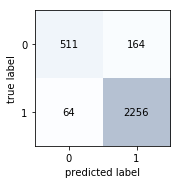

In [91]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train,Y_train)
y_pred = knn.predict(X_test)
print(metrics.accuracy_score(Y_test,y_pred))

cm = confusion_matrix(Y_test, 
                      y_pred)
fig, ax = plot_confusion_matrix(conf_mat=cm)
plt.figure(figsize=(1,1))


plt.show()



('accuracy on the training subset: ', 0.998568770573923)
('accuracy on the testing subset: ', 0.9879799666110184)


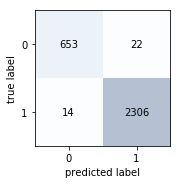

In [92]:
clf = DecisionTreeClassifier(random_state=0)

clf = clf.fit(X_train,Y_train)
Y_pred = clf.predict(X_test)
print("accuracy on the training subset: ",clf.score(X_train,Y_train))
print("accuracy on the testing subset: ",clf.score(X_test,Y_test))
cm = confusion_matrix(Y_test, 
                      Y_pred)
fig, ax = plot_confusion_matrix(conf_mat=cm)
plt.figure(figsize=(1,1))


plt.show()



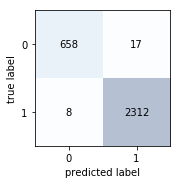

('accuracy on the training subset: ', 0.998568770573923)
('accuracy on the testing subset: ', 0.991652754590985)


In [93]:
get_ipython().magic('matplotlib inline')

forest = RandomForestClassifier(n_estimators=100,random_state=0)
forest.fit(X_train,Y_train)
Y_pred = forest.predict(X_test)
cm = confusion_matrix(Y_test, 
                      Y_pred)
fig, ax = plot_confusion_matrix(conf_mat=cm)
plt.figure(figsize=(1,1))


plt.show()
print("accuracy on the training subset: ",forest.score(X_train,Y_train))
print("accuracy on the testing subset: ",forest.score(X_test,Y_test))

In [80]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.tree import DecisionTreeClassifier

# fits PCA, transforms data and fits the decision tree classifier
# on the transformed data
pipe = Pipeline([('pca', PCA(n_components=45)),
                 ('tree', DecisionTreeClassifier())])


pipe.fit(X_train, Y_train)

Y_pred = pipe.predict(X_test)
print("accuracy on the training subset: ",pipe.score(X_train,Y_train))
print("accuracy on the testing subset: ",pipe.score(X_test,Y_test)) 

('accuracy on the training subset: ', 0.9987118935165307)
('accuracy on the testing subset: ', 0.9869782971619365)


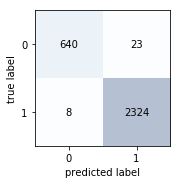

In [84]:
import numpy as np
import matplotlib.pyplot as plt
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(Y_test, 
                      Y_pred)
fig, ax = plot_confusion_matrix(conf_mat=cm)
plt.figure(figsize=(1,1))


plt.show()


In [94]:
clf=svm.SVC()
clf = clf.fit(X_train,Y_train)
Y_pred = clf.predict(X_test)
print("accuracy on the training subset: ",clf.score(X_train,Y_train))
print("accuracy on the testing subset: ",clf.score(X_test,Y_test))

('accuracy on the training subset: ', 0.9984256476313152)
('accuracy on the testing subset: ', 0.9111853088480801)


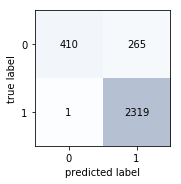

In [95]:
import numpy as np
import matplotlib.pyplot as plt
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(Y_test, 
                      Y_pred)
fig, ax = plot_confusion_matrix(conf_mat=cm)
plt.figure(figsize=(1,1))


plt.show()